In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

In [ ]:
folder_path = '/content/drive/MyDrive/Test-Images'

# List all image files in the folder
image_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith(('.png', '.JPG', '.jpeg'))]

print("Images found:", image_paths)
print(f"Number of images found: {len(image_paths)}")

Images found: ['/content/drive/MyDrive/Test-Images/DJI_0563.JPG', '/content/drive/MyDrive/Test-Images/DJI_0657.JPG', '/content/drive/MyDrive/Test-Images/DJI_0731.JPG', '/content/drive/MyDrive/Test-Images/DJI_0755.JPG', '/content/drive/MyDrive/Test-Images/DJI_0284.JPG', '/content/drive/MyDrive/Test-Images/DJI_0062.JPG', '/content/drive/MyDrive/Test-Images/DJI_0127.JPG', '/content/drive/MyDrive/Test-Images/DJI_0549.JPG', '/content/drive/MyDrive/Test-Images/DJI_0323.JPG', '/content/drive/MyDrive/Test-Images/DJI_0072.JPG']
Number of images found: 10


In [ ]:
# Function to display images with predictions
def display_image_with_boxes(image_path, results):
    img = Image.open(image_path)
    img_np = np.array(img)
    boxes = results.xyxy[0].cpu().numpy()  # xyxy format of bounding boxes

    for box in boxes:
        x1, y1, x2, y2, conf, cls = box
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        label = model.names[int(cls)]
        cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img_np, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(img_np)
    plt.axis('off')
    plt.show()


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0563.JPG: 480x640 131 trees, 178.1ms
Speed: 6.5ms preprocess, 178.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


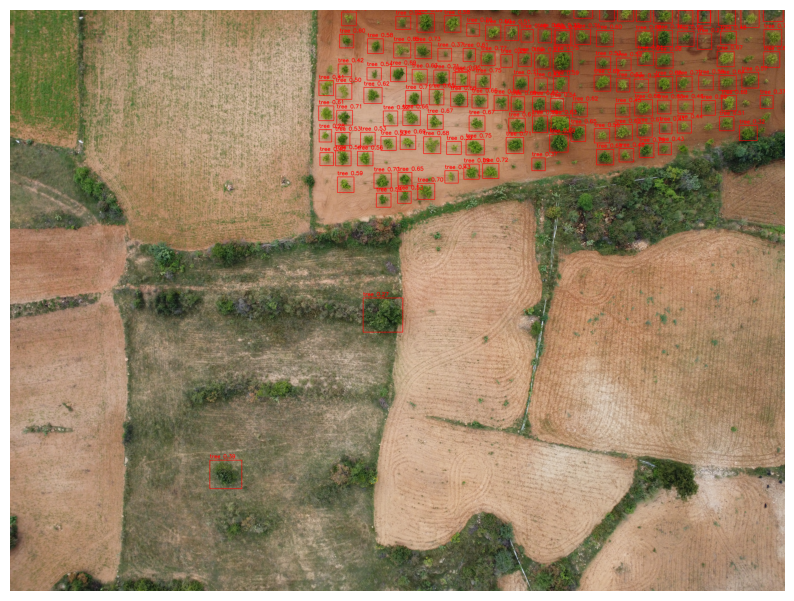


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0657.JPG: 480x640 43 trees, 10.0ms
Speed: 4.0ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


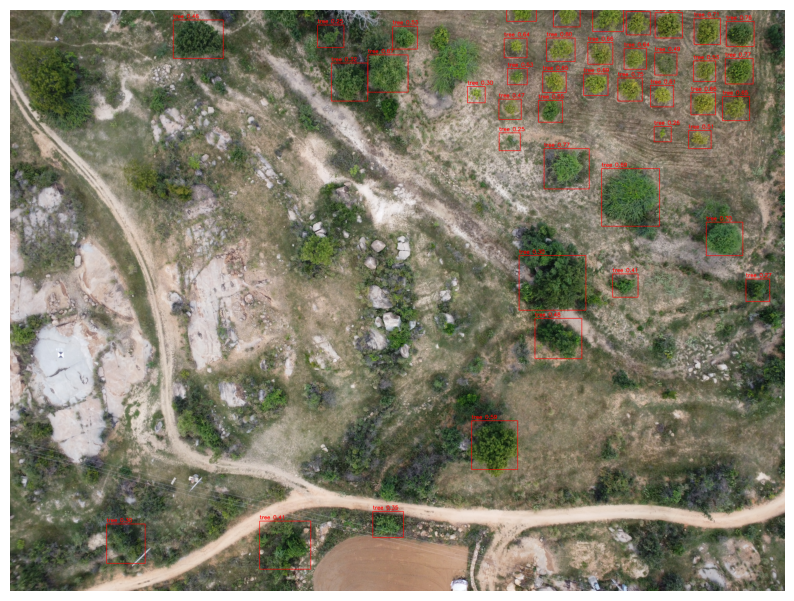


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0731.JPG: 480x640 134 trees, 12.3ms
Speed: 4.1ms preprocess, 12.3ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


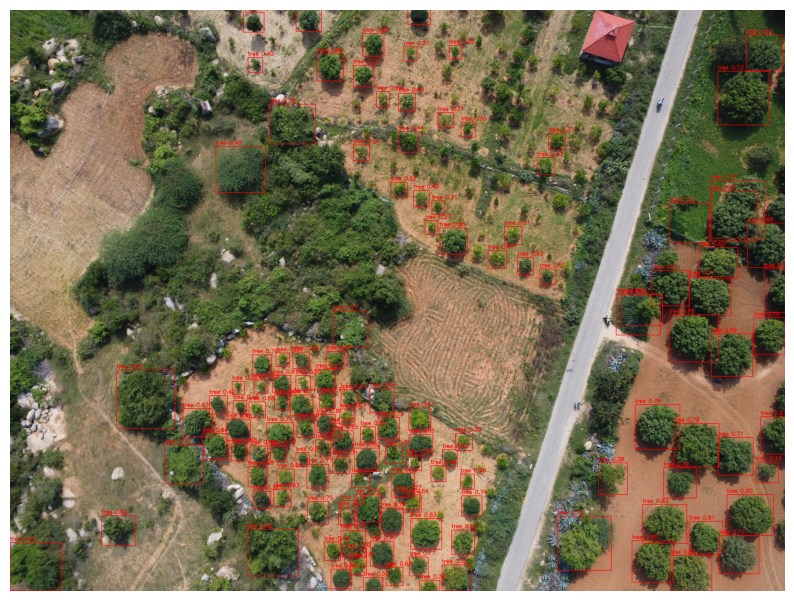


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0755.JPG: 480x640 69 trees, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


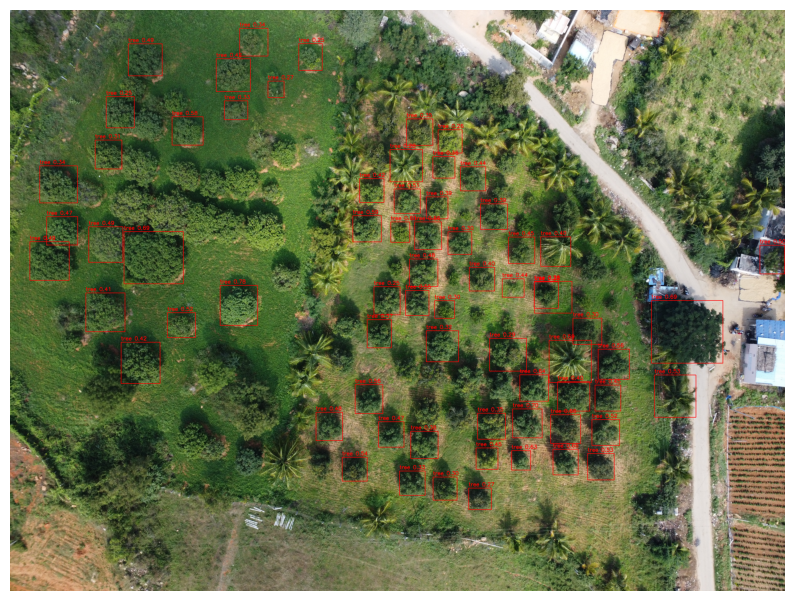


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0284.JPG: 480x640 76 trees, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


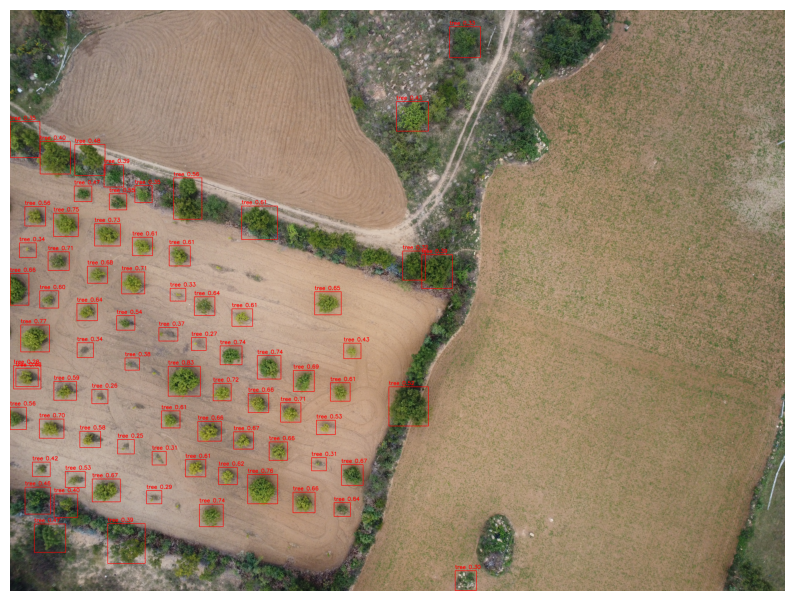


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0062.JPG: 480x640 130 trees, 15.5ms
Speed: 4.1ms preprocess, 15.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


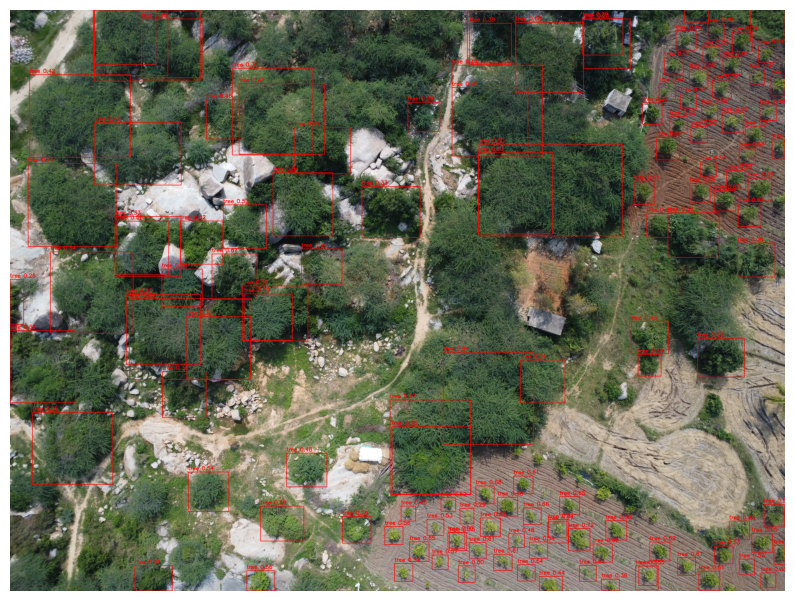


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0127.JPG: 480x640 176 trees, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


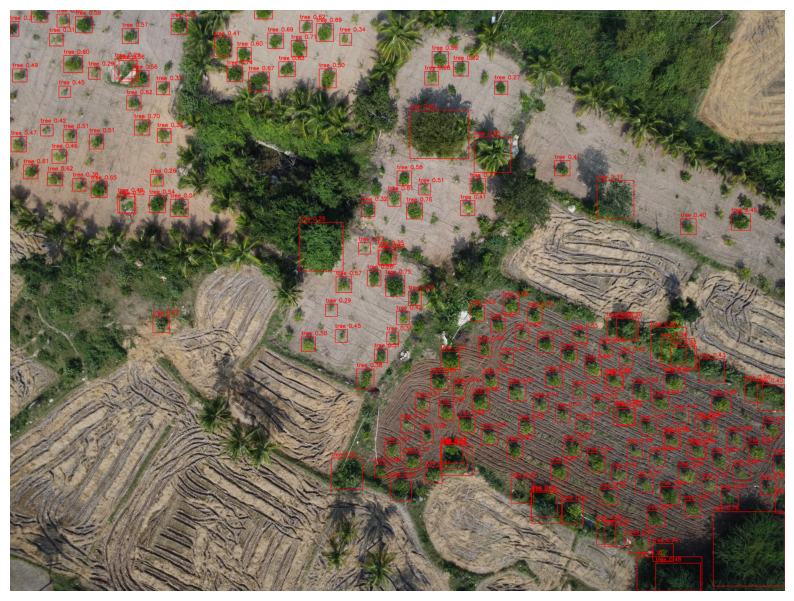


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0549.JPG: 480x640 190 trees, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


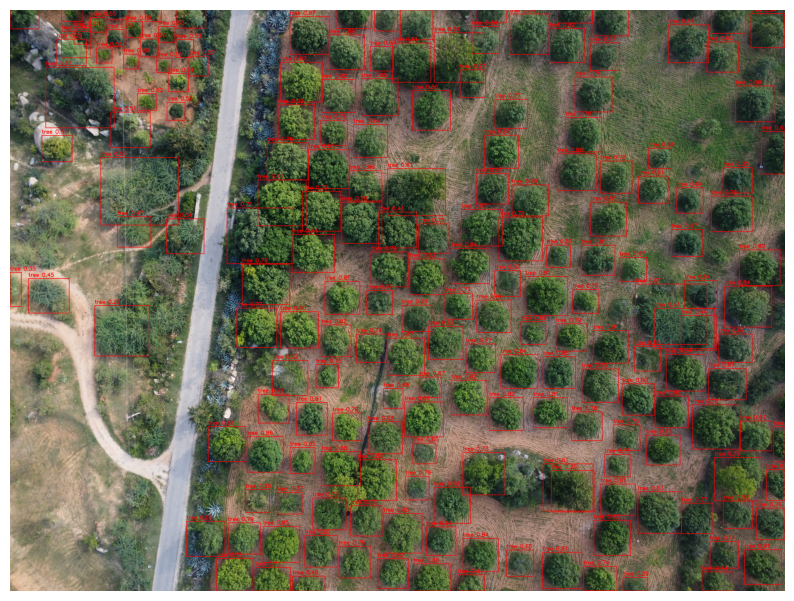


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0323.JPG: 480x640 16 trees, 10.2ms
Speed: 4.0ms preprocess, 10.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


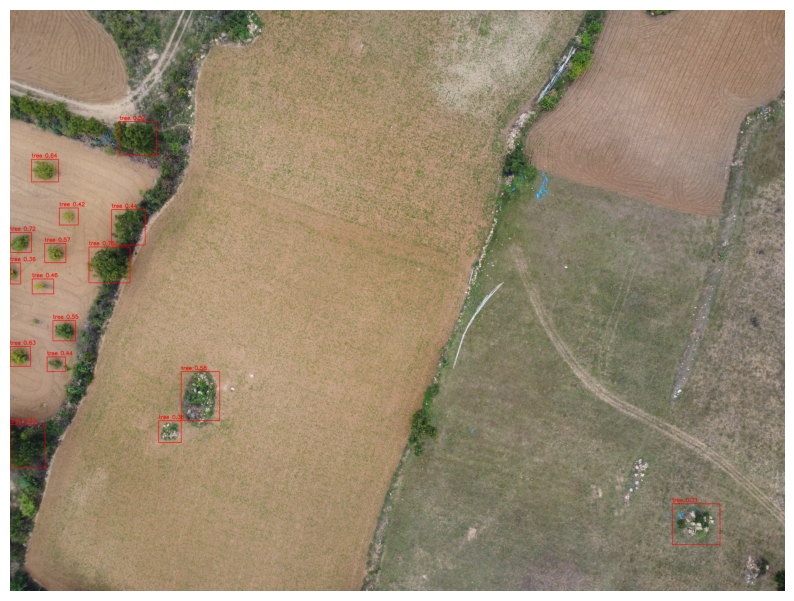


image 1/1 /content/drive/MyDrive/Test-Images/DJI_0072.JPG: 480x640 80 trees, 6.8ms
Speed: 3.8ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


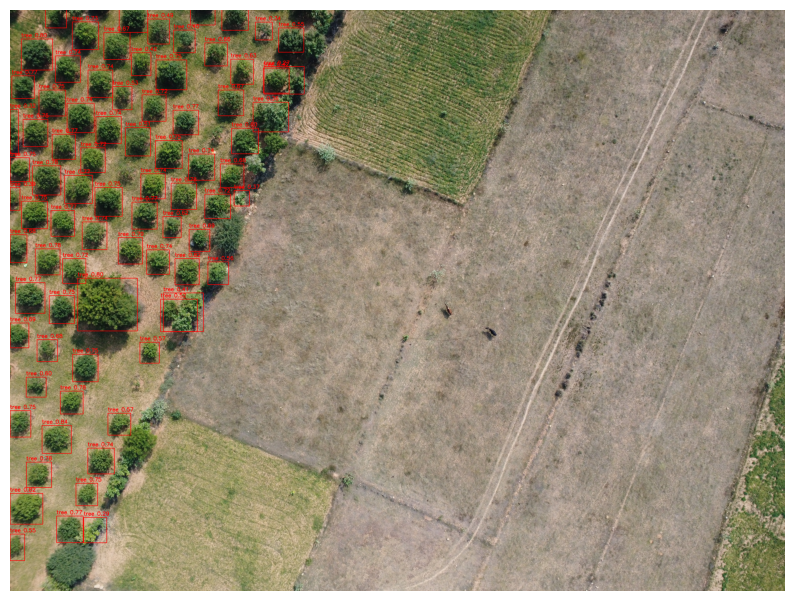

In [ ]:
def display_image_with_boxes(image_path, results):
    img = Image.open(image_path)
    img_np = np.array(img)

    # Iterate over predictions
    for result in results:
        # Assuming each result contains a `boxes` attribute
        boxes = result.boxes.xyxy  # xyxy format of bounding boxes
        scores = result.boxes.conf  # confidence scores
        classes = result.boxes.cls  # class indices

        # Iterate over boxes
        for box, score, cls in zip(boxes, scores, classes):
            x1, y1, x2, y2 = map(int, box[:4])
            conf = score
            cls = int(cls)
            label = model.names[cls]

            # Draw bounding box and label on the image
            cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img_np, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(img_np)
    plt.axis('off')
    plt.show()

# Run predictions on each image and display results
for image_path in image_paths:
    results = model.predict(source=image_path)
    display_image_with_boxes(image_path, results)